In [265]:
import pandas as pd
import random

#filepath = r"/mnt/c/Users/kathr/Documents/CV4E/wildcam_fulldata_2019.csv"
#df = pd.read_csv(filepath)

filepath = r"/mnt/c/Users/kathr/OneDrive - UBC/UBC/Gorongosa/Camera trap metadata/wildcam_fulldata_2019 (1).csv"
df = pd.read_csv(filepath)

In [207]:
df
df.describe()

,count,juvenile,moving,eating,resting,standing,interacting,male,juvenile_count,male_count
count,276577.000000,276960.000000,276960.000000,276960.000000,276954.000000,276960.000000,276949.000000,229290.000000,31751.000000,36872.000000
mean,1.435980,0.111182,0.638709,0.234055,0.067549,0.483377,0.030811,0.364521,0.042613,0.425336
std,1.313892,0.459328,0.454643,0.423408,0.250971,0.499724,0.172805,0.568352,0.230668,0.604658
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
max,30.000000,17.000000,1.000000,1.000000,1.000000,1.000000,1.000000,12.000000,4.000000,10.000000


In [208]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313710 entries, 0 to 313709
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Classifier      313710 non-null  object 
 1   site            313710 non-null  object 
 2   species         313710 non-null  object 
 3   datetime        313710 non-null  object 
 4   count           276577 non-null  float64
 5   juvenile        276960 non-null  float64
 6   moving          276960 non-null  float64
 7   eating          276960 non-null  float64
 8   resting         276954 non-null  float64
 9   standing        276960 non-null  float64
 10  interacting     276949 non-null  float64
 11  male            229290 non-null  float64
 12  directory       288041 non-null  object 
 13  filename        298517 non-null  object 
 14  date            313710 non-null  object 
 15  time            313710 non-null  object 
 16  juvenile_count  31751 non-null   float64
 17  male_count

In [209]:
df["directory"].unique() #gives all unique values in the column

array(['Merged_no_ghost/A06/Baboon', 'Complete/A06/Baboon',
       'Merged_no_ghost/A06/Bird_other', ..., 'D07/D07_R1/100EK113',
       'B07/B07_R1/100EK113', 'D07/D07_R1/101EK113'], dtype=object)

In [210]:
df["directory"].nunique() #gives number of unique values in the column

74986

In [211]:
len(df["directory"]) #counts number of values in this column 

313710

In [212]:
df["directory"].isnull().sum() #counts number of null values in this column

np.int64(25669)

In [213]:
df["filename"].unique() #gives all unique values in the column

array(['2016 07 17 14 44 03.JPG', '2016 07 17 15 01 58.JPG',
       '2016 07 18 06 44 49.JPG', ..., '07200294.JPG', '07200296.JPG',
       '07200298.JPG'], dtype=object)

In [214]:
df["filename"].nunique() #gives number of unique values in the column

240088

In [215]:
df["filename"].isnull().sum() #counts number of null values in this column

np.int64(15193)

In [216]:
df["filename"].isna().sum()

np.int64(15193)

In [217]:
df.dropna(subset='filename').duplicated(subset = ["filename"]) #return any duplicates, ignoring NAs

0         False
1         False
2         False
3         False
4         False
          ...  
301887     True
301888     True
301889     True
301890     True
301891     True
Length: 298517, dtype: bool

In [218]:
filtered_df = df.dropna(subset=['filename', 'directory']) #remove NAs in these two columns
duplicates = filtered_df[filtered_df.duplicated(subset = ["filename"], keep=False)] #creates df with all rows that have duplicate filename
duplicates

,Classifier,site,species,datetime,count,juvenile,moving,eating,resting,standing,interacting,male,directory,filename,date,time,juvenile_count,male_count
5,KG/Undergrads/MSP,A06,baboon,2016-07-18 06:48:00,2.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,Merged_no_ghost/A06/Baboon,2016 07 18 06 48 01.JPG,7/18/16,6:48,NaN,NaN
28,KG/Undergrads/MSP,A06,baboon,2016-09-25 06:05:00,1.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,Merged_no_ghost/A06/Baboon,2016 09 25 06 05 57.JPG,9/25/16,6:05,NaN,NaN
37,KG/Undergrads/MSP,A06,baboon,2016-10-23 08:53:00,1.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,Merged_no_ghost/A06/Baboon,2016 10 23 08 53 05.JPG,10/23/16,8:53,NaN,NaN
45,KG/Undergrads/MSP,A06,baboon,2016-11-09 08:31:00,1.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,Merged_no_ghost/A06/Baboon,2016 11 09 08 31 15.JPG,11/9/16,8:31,NaN,NaN
96,KG/Undergrads/MSP,A06,buffalo,2016-11-24 06:06:00,3.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,Complete/A06/Buffalo,11240115.JPG,11/24/16,6:06,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297508,MSP,D07,baboon,2018-07-20 14:11:00,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,D07/D07_R1/101EK113,07200296.JPG,2018-07-20,14:11:00,0.0,0.0
297509,MSP,D07,nyala,2018-07-20 14:11:00,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,D07/D07_R1/101EK113,07200297.JPG,2018-07-20,14:11:00,0.0,1.0
297510,MSP,D07,impala,2018-07-20 14:11:00,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,D07/D07_R1/101EK113,07200297.JPG,2018-07-20,14:11:00,0.0,1.0
297511,MSP,D07,baboon,2018-07-20 14:11:00,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,D07/D07_R1/101EK113,07200297.JPG,2018-07-20,14:11:00,0.0,0.0


In [219]:
#only looks at given two columns
#if the only duplicates are because there are two species in a photo, this should yield all FALSE
filtered_df['is_duplicate'] = filtered_df.duplicated(subset = ["directory", "filename"], keep =False)

/tmp/ipykernel_28099/1807176831.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['is_duplicate'] = filtered_df.duplicated(subset = ["directory", "filename"], keep =False)


In [220]:
filtered_df['is_duplicate'].unique()

array([False,  True])

In [221]:
filtered_df['is_duplicate'].sum()

np.int64(1920)

In [222]:
filtered_df[filtered_df['is_duplicate']==True]

,Classifier,site,species,datetime,count,juvenile,moving,eating,resting,standing,interacting,male,directory,filename,date,time,juvenile_count,male_count,is_duplicate
15082,KG/Undergrads/MSP,E02,bushbuck,2016-11-03 08:29:00,2.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,Merged_no_ghost/E02/Bushbuck,2016 11 03 08 29 31.JPG,11/3/16,8:29,NaN,NaN,True
15083,KG/Undergrads/MSP,E02,oribi,2016-11-03 08:29:00,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,Merged_no_ghost/E02/Bushbuck,2016 11 03 08 29 31.JPG,11/3/16,8:29,NaN,NaN,True
15094,KG/Undergrads/MSP,E02,bushbuck,2016-11-03 21:37:00,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,Merged_no_ghost/E02/Bushbuck,2016 11 03 21 37 31.JPG,11/3/16,21:37,NaN,NaN,True
15095,KG/Undergrads/MSP,E02,oribi,2016-11-03 21:37:00,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,Merged_no_ghost/E02/Bushbuck,2016 11 03 21 37 31.JPG,11/3/16,21:37,NaN,NaN,True
23558,KG/Undergrads/AT,E10,baboon,2017-05-08 17:27:00,2.0,0.0,1.0,0.0,0.0,1.0,0.0,NaN,Complete/E10/Baboon,05080680.JPG,5/8/17,17:27,NaN,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297507,MSP,D07,impala,2018-07-20 14:11:00,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,D07/D07_R1/101EK113,07200296.JPG,2018-07-20,14:11:00,0.0,1.0,True
297508,MSP,D07,baboon,2018-07-20 14:11:00,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,D07/D07_R1/101EK113,07200296.JPG,2018-07-20,14:11:00,0.0,0.0,True
297509,MSP,D07,nyala,2018-07-20 14:11:00,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,D07/D07_R1/101EK113,07200297.JPG,2018-07-20,14:11:00,0.0,1.0,True
297510,MSP,D07,impala,2018-07-20 14:11:00,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,D07/D07_R1/101EK113,07200297.JPG,2018-07-20,14:11:00,0.0,1.0,True


In [223]:
len(filtered_df['is_duplicate'])

284669

In [224]:
filtered_df['filename'].isna().sum()

np.int64(0)

In [225]:
filtered_df_spfile = df.dropna(subset=['filename', 'species']) #remove NAs in these two columns
duplicates_spfile = filtered_df_spfile[filtered_df_spfile.duplicated(subset = "filename", keep=False)] #creates df with all rows that have duplicate filename

In [226]:
# duplicates = filtered_df_spfile.duplicated(subset=['species', 'filename'], keep=False)
# duplicate_indices = filtered_df_spfile[duplicates].index

# for idx in duplicate_indices:
#     duplicate_pair = df[(df['species'] == df.loc[idx, 'species']) & (df['filename'] == df.loc[idx, 'filename'])] 
#     print(f"Row {idx} duplicates:") 
#     print(duplicate_pair) 
#     print("-" * 50)


In [227]:
#only looks at given two columns
#if the only duplicates are because there are two species in a photo, this should yield all FALSE
filtered_df_spfile['is_duplicate'] = filtered_df_spfile.duplicated(subset = ["species", "filename"], keep =False)

/tmp/ipykernel_28099/53274913.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df_spfile['is_duplicate'] = filtered_df_spfile.duplicated(subset = ["species", "filename"], keep =False)


In [228]:
# duplicates_true = C[filtered_df_spfile['is_duplicate']==True]

In [229]:
# filtered_df_spfile[duplicates_true].index

In [230]:
filtered_df_spfile[(filtered_df_spfile['species']=='bushbuck') & (filtered_df_spfile['is_duplicate']==True)]

,Classifier,site,species,datetime,count,juvenile,moving,eating,resting,standing,interacting,male,directory,filename,date,time,juvenile_count,male_count,is_duplicate
988,KG/Undergrads/MSP,A08,bushbuck,2016-11-15 19:15:00,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,Complete/A08/Bushbuck,11150021.JPG,11/15/16,19:15,NaN,NaN,True
3359,KG/Undergrads/MSP,B07,bushbuck,2016-11-26 21:00:00,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,Complete/B07/Bushbuck,EK000131.JPG,11/26/16,21:00,NaN,NaN,True
5985,KG/Undergrads/MSP,C06,bushbuck,2017-04-18 18:57:00,3.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,Complete/C06/Bushbuck,04180313.JPG,4/18/17,18:57,NaN,NaN,True
5986,KG/Undergrads/MSP,C06,bushbuck,2017-04-18 18:58:00,3.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,Complete/C06/Bushbuck,04180315.JPG,4/18/17,18:58,NaN,NaN,True
5987,KG/Undergrads/MSP,C06,bushbuck,2017-04-18 18:59:00,3.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,Complete/C06/Bushbuck,04180317.JPG,4/18/17,18:59,NaN,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301887,MSP,D05,bushbuck,2019-05-24 18:47:00,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,09060214.JPG,2019-05-24,18:47:00,0.0,0.0,True
301888,MSP,D05,bushbuck,2019-05-24 18:48:00,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,09060215.JPG,2019-05-24,18:48:00,0.0,0.0,True
301889,MSP,D05,bushbuck,2019-05-24 18:48:00,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,09060216.JPG,2019-05-24,18:48:00,0.0,0.0,True
301890,MSP,D05,bushbuck,2019-05-24 18:49:00,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,09060217.JPG,2019-05-24,18:49:00,0.0,0.0,True


In [231]:
#Let's try and create the correct file paths
import os

# Define the root directory
# if this throws errors and can't find the file on the hard drive,
# restart my laptop and leave the external drive plugged in
#update: 'Aug_Nov_2016_Merged_NoGhost' is redundant
root_path = '/mnt/d'
dirs = ['JUNE 2016 TO JUNE 2017 NO GHOST', 'JUNE 2018 SORTED']

# Initialize an empty dictionary to store the results
image_paths = {}
for root_dir in dirs:
    season = root_dir
    root_dir = os.path.join(root_path, root_dir)
    # Walk through the directory structure
    for cameraid in os.listdir(root_dir):
        camera_dir = os.path.join(root_dir, cameraid)
        #print(camera_dir)
    
        # Skip if it's not a directory
        if not os.path.isdir(camera_dir):
            continue
    
        for speciesid in os.listdir(camera_dir):
            #print(speciesid)
            if speciesid in ['Flood', 'Rain', 'Human', 'Fire', 'Setup', 'Setup 2', 'Human 2', 'Insect', 'Unknown', 'Unknown 2']:
                continue #go back to the for loop and do the next iteration
            #break <- this would break the whole for loop 
            species_dir = os.path.join(camera_dir, speciesid)
        
            # Skip if it's not a directory
            if not os.path.isdir(species_dir):
                continue
        
            # Get list of image files in the speciesid directory
            image_files = [f for f in os.listdir(species_dir) if f.lower().endswith('.jpg') and 'jpg_original' not in f and not f.startswith('.')]
        
            if image_files:
                # Add the speciesid directory and corresponding image files to the dictionary
                image_paths[os.path.join(season, os.path.join(cameraid, speciesid))] = image_files

    # Print the resulting dictionary
    print(image_paths)

{'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon': ['11250123.JPG', '11300159.JPG', '11300160.JPG', '11300161.JPG', '12130207.JPG', '12130209.JPG', '12130210.JPG', '2016 07 17 14 44 03.JPG', '2016 07 17 14 44 04.JPG', '2016 07 17 15 01 58.JPG', '2016 07 17 15 01 59.JPG', '2016 07 18 06 44 49.JPG', '2016 07 18 06 44 50.JPG', '2016 07 18 06 46 44.JPG', '2016 07 18 06 46 45.JPG', '2016 07 18 06 47 22.JPG', '2016 07 18 06 47 23.JPG', '2016 07 18 06 48 01.JPG', '2016 07 18 06 48 02.JPG', '2016 07 19 08 46 27.JPG', '2016 07 19 08 46 28.JPG', '2016 07 22 07 13 30.JPG', '2016 07 22 07 13 31.JPG', '2016 08 23 07 59 47.JPG', '2016 08 23 07 59 48.JPG', '2016 08 23 08 00 29.JPG', '2016 08 23 08 00 30.JPG', '2016 08 23 08 02 37.JPG', '2016 08 23 08 02 38.JPG', '2016 08 23 08 03 09.JPG', '2016 08 23 08 03 10.JPG', '2016 09 01 08 33 35.JPG', '2016 09 01 08 33 36.JPG', '2016 09 08 14 23 13.JPG', '2016 09 08 14 23 14.JPG', '2016 09 11 05 48 08.JPG', '2016 09 11 05 48 09.JPG', '2016 09 11 15 59 38.JPG', '20

In [232]:
image_paths.keys()

dict_keys(['JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Bird_other', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Buffalo', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Bushbaby', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Bushbuck', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Bushpig', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Civet', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Elephant', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Genet', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Guineafowl_helmeted', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Hare', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Honey_badger', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Impala', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Kudu', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Mongoose_white_tailed', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Monitor_lizard', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Oribi', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Porcupine', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Reedbuck', 'JUNE 2016 TO JUNE 2017 NO GHOST/A06/Unknown_antelope', 'JUNE 2

In [233]:
sum([len(image_paths[k]) for k in image_paths])

412871

In [234]:
df = pd.DataFrame([(k, v) for k, values in image_paths.items() for v in values], 
                  columns=["dir_path", "file_name"])

In [235]:
df.to_csv("data/image_paths.csv", index=False)

In [236]:
df = pd.read_csv("data/image_paths.csv")

In [237]:
df.describe()
df.head()

,dir_path,file_name
0,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,11250123.JPG
1,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,11300159.JPG
2,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,11300160.JPG
3,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,11300161.JPG
4,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,12130207.JPG


In [238]:
df["image_path"] = [os.path.join(df.dir_path[x], df.file_name[x]) for x in range(len(df.dir_path))]

In [239]:
df.to_csv("data/image_paths_complete.csv", index=False)

In [240]:
df = pd.read_csv("data/image_paths_complete.csv")

In [241]:
df.head()

,dir_path,file_name,image_path
0,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,11250123.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon/112...
1,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,11300159.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon/113...
2,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,11300160.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon/113...
3,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,11300161.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon/113...
4,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon,12130207.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon/121...


In [242]:
sum(df.image_path.duplicated())


0

In [243]:
from PIL import Image
from PIL.ExifTags import TAGS
from tqdm import tqdm

# def get_datetime_original(image_path):
#     # Open the image
#     img = Image.open(image_path)
    
#     # Get EXIF data
#     exif_data = img._getexif()
    
#     if exif_data:
#         # Access DateTimeOriginal directly using the tag number
#         datetime_original = exif_data.get(36867)
#         return datetime_original
#     return "1970:01:01 00:00:00"



#loop over rows in the data set (testing with first row)

#initialize new columns to be filled in later
df['spp'] = pd.NA
df['camera'] = pd.NA
df['spp_clean'] = pd.NA
# df['datetime'] = pd.NA

for index, row in tqdm(df.iterrows(), total=421167):
    # print(f"row : {row}") 
    # print(f"index : {index}") 
    
    dir_path = row["dir_path"]

    dir_path_elems = dir_path.split('/')
   # print(dir_path_elems)

    spp = dir_path_elems[2]
    #print(spp)

    spp_clean = None #reset for every iteration
    #now working on a clean species name
    if "baboon" in spp.lower():
        spp_clean = "baboon"
    
    #testing to make sure this does what we think it should
    # print(f"spp: {spp}")
    # print(f"spp_clean : {spp_clean}")
    # print("")
    
    elif "bushbuck" in spp.lower():
        spp_clean = "bushbuck"

    elif "bird_other" in spp.lower():
        spp_clean = "bird_other"

    elif "hare" in spp.lower():
        spp_clean = "hare"

    elif "warthog" in spp.lower():
        spp_clean = "warthog"

    elif "guineafowl_helmeted" in spp.lower():
        spp_clean = "guineafowl_helmeted"

    elif "civet" in spp.lower():
        spp_clean = "civet"

    elif "elephant" in spp.lower():
        spp_clean = "elephant"

    elif "kudu" in spp.lower():
        spp_clean = "kudu"

    elif "nyala" in spp.lower():
        spp_clean = "nyala"

    elif "oribi" in spp.lower():
        spp_clean = "oribi"

    elif "genet" in spp.lower(): 
        spp_clean = "genet"

    elif "honey_badger" in spp.lower():
        spp_clean = "honey_badger"

    elif "hippo" in spp.lower():
        spp_clean = "hippo"

    elif "sable_antelope" in spp.lower():
        spp_clean = "sable_antelope"

    elif "impala" in spp.lower():
        spp_clean = "impala"

    elif "bat" in spp.lower():
        spp_clean = "bat"

    elif "rodent" in spp.lower():
        spp_clean = "rodent"

    elif "porcupine" in spp.lower():
        spp_clean = "porcupine"

    elif "mongoose_dwarf" in spp.lower():
        spp_clean = "mongoose_dwarf"

    elif "monitor_lizard" in spp.lower():
        spp_clean = "monitor_lizard"

    elif "lion" in spp.lower():
        spp_clean = "lion"

    elif "bushbaby" in spp.lower():
        spp_clean = "bushbaby"

    elif "pangolin" in spp.lower():
        spp_clean = "pangolin"

    elif "mongoose_white" in spp.lower():
        spp_clean = "mongoose_white_tailed"

    elif "buffalo" in spp.lower():
        spp_clean = "buffalo"

    elif "reedbuck" in spp.lower():
        spp_clean = "reedbuck"
    
    elif "waterbuck" in spp.lower():
        spp_clean = "waterbuck"

    elif "hornbill" in spp.lower():
        # 'hornbill_ground 2'
        spp_clean = "ground_hornbill"

    elif "mongoose_large_" in spp.lower():
    #elif spp.lower() in ["mongoose_large_grey", "mongoose_large_gray"]:
        spp_clean = "mongoose_large_grey"

    elif "mongoose_other" in spp.lower():
        spp_clean = "mongoose_other"

    elif "sable_antelope" in spp.lower():
        # 'sable_antilope 345 rain monkey'
        spp_clean = "sable_antelope"

    elif "vervet" in spp.lower():
        spp_clean = "vervet"

    elif "unknown_antelope" in spp.lower():
        spp_clean = "unknown_antelope"

    elif "bushpig" in spp.lower():
        spp_clean = "bushpig"

    elif "lizard" in spp.lower():
        spp_clean = "lizard"

    elif "mongoose_marsh" in spp.lower():
        spp_clean = "mongoose_marsh"

    elif spp in ['Eland', 'Reptile', 'Samango', 'Aardvark', 'Serval', 'Mongoose_slender', 'Wildebeest', 'Hartebeest', 'Mongoose_bushy_tailed', 'Duiker_common', 'Snake', 'Guineafowl_crested', 'Mongoose_banded', 'Duiker_red', 'Mongoose_unknown', 'Duiker_unknown']:
         spp_clean = spp.lower()
    

    camera = dir_path_elems[1]
    # print(camera)

    img_fpath = '/mnt/d/' + row['image_path'] #image full path
    # print(img_fpath)

    #let's find the image
    # if os.path.exists(img_fpath):
        # print("file exists")

    # image = Image.open(img_fpath) #opening the image
    # exif_data = image._getexif() #returns None if it can't find anything

    # datetime = "1970:01:01 00:00:00" #make this default value if you can't find the datetimeoriginal

    # datetime = get_datetime_original(img_fpath)
    # ^^didn't choose NA so the whole column is all dates
    
    # # Check if EXIF data is available
    # if exif_data is not None: 
    #     # Loop through EXIF data and print each tag
    #     for tag, value in exif_data.items(): #exif data can't be read by humans
    #         tag_name = TAGS.get(tag, tag) # Get human-readable tag name, TAGS is a dictionary, gets imported as part of a module
    #         #^if you can't find the human-readable tag, return the original tag
    #         #print(f"{tag_name}: {value}")

    #         if tag_name == "DateTimeOriginal":
    #             print(f"tag")
    #             datetime = value
    #             break


    # print(f"\nspp : {spp}") #\n starts a new line
    # print(f"camera : {camera}")
    # print(f"datetime : {datetime}")

    df.at[index, 'spp'] = spp #fill in species column in data frame
    df.at[index, 'camera'] = camera
    df.at[index, 'spp_clean'] = spp_clean
    # df.at[index, 'datetime'] = datetime

    # if index > 10:
    #     break

print(df)

#now I want to save it as a csv so I can use it without running everything again
#saves to current directory
df.to_csv('data/ct_data.csv', index=False)

 98%|█████████▊| 412871/421167 [00:46<00:00, 8846.42it/s]


                                          dir_path     file_name  \
0       JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon  11250123.JPG   
1       JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon  11300159.JPG   
2       JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon  11300160.JPG   
3       JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon  11300161.JPG   
4       JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon  12130207.JPG   
...                                            ...           ...   
412866              JUNE 2018 SORTED/M10/Waterbuck  11170689.JPG   
412867              JUNE 2018 SORTED/M10/Waterbuck  11170690.JPG   
412868              JUNE 2018 SORTED/M10/Waterbuck  11170691.JPG   
412869              JUNE 2018 SORTED/M10/Waterbuck  11170692.JPG   
412870              JUNE 2018 SORTED/M10/Waterbuck  11170693.JPG   

                                               image_path        spp camera  \
0       JUNE 2016 TO JUNE 2017 NO GHOST/A06/Baboon/112...     Baboon    A06   
1       JUNE 2016 TO JUNE

In [244]:
#checking which rows aren't filled in
rows_with_none = df[df['spp_clean'].isnull()] #checking which rows are empty
#returns all null rows (TRUE/FALSE), wrapping it with df will return all the rows that are true

#print(rows_with_none)

unsigned_spp = rows_with_none['spp'].values
#print(unsigned_spp)

unique_values = list(set(unsigned_spp)) #list(set) <- taking unique values
if len(unique_values) > 0:
    print("You need to keep checking")
    print(unique_values)

else:
    print("yay!")


#df[i,j] i is row, j is column

yay!


In [ ]:
df.spp_clean #this gives the column, this is getting one thing (spp) from another thing (df)

df.spp_clean.unique()  # unique(df$spp) <- R equivalent

#upon initial run, this yields folders called things like "Baboon" and "Baboon 2"
#working hypothesis is that these are folders that contain images from Aug-Nov 2016, and then Nov 2016-June 2017
#based on how these images were processed
#also yields names like 'Honey_badger\uf028', which seem to be due to a funky symbol after the name

In [118]:
#let's explore where the issues/confusing names are
df.query("spp == 'Insect'")
#df.query("spp == 'Honey_badger\uf028'")


,dir_path,file_name,image_path,spp,camera,spp_clean
170410,JUNE 2016 TO JUNE 2017 NO GHOST/H09/Insect,2016 07 13 03 35 17.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/H09/Insect/201...,Insect,H09,insect
170411,JUNE 2016 TO JUNE 2017 NO GHOST/H09/Insect,2016 07 13 03 35 18.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/H09/Insect/201...,Insect,H09,insect
170412,JUNE 2016 TO JUNE 2017 NO GHOST/H09/Insect,2016 07 13 03 37 45.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/H09/Insect/201...,Insect,H09,insect
170413,JUNE 2016 TO JUNE 2017 NO GHOST/H09/Insect,2016 07 13 03 37 46.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/H09/Insect/201...,Insect,H09,insect
182108,JUNE 2016 TO JUNE 2017 NO GHOST/K12/Insect,2016 09 26 01 33 58.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/K12/Insect/201...,Insect,K12,insect
182109,JUNE 2016 TO JUNE 2017 NO GHOST/K12/Insect,2016 09 26 01 33 59.JPG,JUNE 2016 TO JUNE 2017 NO GHOST/K12/Insect/201...,Insect,K12,insect


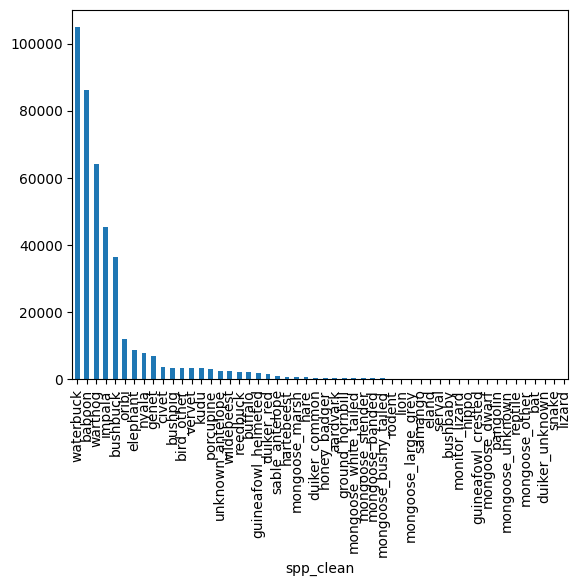

In [245]:

import matplotlib.pyplot as plt #ggplot for python

df["spp_clean"].value_counts().plot(kind = "bar")

plt.show()

In [264]:
df.describe()

,dir_path,file_name,image_path,spp,camera,spp_clean
count,412871,412871,412871,412871,412871,412871
unique,2575,288497,412871,82,60,52
top,JUNE 2018 SORTED/K06/Waterbuck,EK000195.JPG,JUNE 2018 SORTED/M10/Waterbuck/11170693.JPG,Waterbuck,K06,waterbuck
freq,8527,21,1,103720,42690,104826


In [262]:
#working to downsample (so I don't have more than x (labeled cutoff here) images per category)
cutoff = 2000
large = df.groupby('spp_clean').filter(lambda x: len(x) > cutoff)
small = df.groupby('spp_clean').filter(lambda x: len(x) <= cutoff)

random.seed(77)
large_sampled = large.groupby('spp_clean').sample(cutoff)

down_df = pd.concat([large_sampled, small], ignore_index=True)

In [263]:
down_df.describe()

,dir_path,file_name,image_path,spp,camera,spp_clean
count,48553,48553,48553,48553,48553,48553
unique,2508,44895,48553,82,60,52
top,JUNE 2018 SORTED/B07/Wildebeest,EK000068.JPG,JUNE 2018 SORTED/M10/Serval/07050636.JPG,Buffalo,K06,baboon
freq,1235,8,1,2000,2759,2000


In [261]:
large.spp_clean.unique()

array(['baboon', 'bushbuck', 'impala', 'warthog', 'waterbuck'],
      dtype=object)

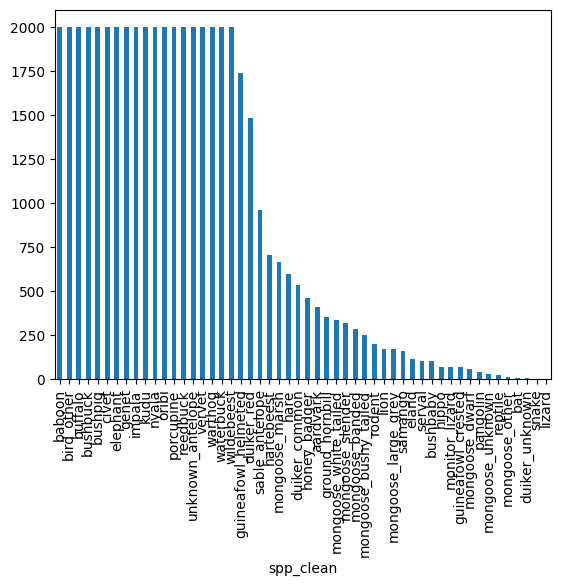

In [266]:
down_df["spp_clean"].value_counts().plot(kind = "bar")

plt.show()